In [1]:
!pip install -Uqq fastai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 49.7 MB/s eta 0:00:00


In [2]:
from fastdownload import download_url

In [3]:
!pip install duckduckgo-search


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 34.0 MB/s eta 0:00:00


In [4]:
from fastai.vision.all import *

In [5]:
from duckduckgo_search import DDGS

def search_image(keyword, max_images=150):
  return L(DDGS().images(keyword, max_results=max_images)).itemgot('image')

In [6]:
grizzly_images = search_image('grizzly bear image', max_images=150)

In [7]:
len(grizzly_images)

150

In [8]:
dest = 'Images/grizzly_images'

img = download_url(grizzly_images[0], dest, show_progress=False)

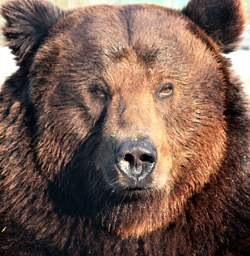

In [9]:
Image.open(img).to_thumb(256,256)

In [10]:
searches = 'grizzly', 'black', 'teddy'
path = Path('bear')

if not path.exists():
  path.mkdir()
  for o in searches:
    dest = (path/o)
    dest.mkdir(parents=True, exist_ok=True)
    results = search_image(f'{o} bear image', max_images=150)
    download_images(dest, urls=results)

In [11]:
len(get_image_files(path))

422

In [12]:
failed = verify_images(get_image_files(path))
failed

(#23) [Path('bear/grizzly/a36ac4f0-c4d8-4633-98eb-6d1fc1791cb9.jpg'),Path('bear/grizzly/635b4e4f-62a5-41cd-9275-85ab92cd6194.JPG'),Path('bear/grizzly/ec7e5c0c-a21a-4fca-9cee-a54e2042959c.jpg'),Path('bear/grizzly/517e97bb-861a-4009-ad66-6a509a2a8c68.jpg'),Path('bear/grizzly/5a11ba68-224d-4f69-a74a-2b32998091b1.jpg'),Path('bear/grizzly/582be88f-90cb-4bbf-96e3-3be0ff7f1950.jpg'),Path('bear/grizzly/b6db1ffe-f858-4ca3-9e68-c262f40ba686.jpg'),Path('bear/grizzly/2fb89d1c-65f8-4b92-8544-14ea60a8e9f3.jpg'),Path('bear/grizzly/f967140e-187f-47dc-bab0-45db9708fdfc.jpg'),Path('bear/grizzly/75c16a97-9eb2-4f4d-bb15-107b1099a836.JPG'),Path('bear/grizzly/e1cbd9cf-dea4-48c9-a725-7f08a7c549c8.JPG'),Path('bear/teddy/f1b37f23-61b7-4ad5-8500-1aae27df0038.jpg'),Path('bear/teddy/9d97a517-e721-4d72-9f2a-28827709bac7.png'),Path('bear/teddy/133c5a30-125f-4eb0-bc7d-2d18c239254c.jpg'),Path('bear/teddy/299cfd42-ca3b-4d91-ba4c-772727acf6b2.jpg'),Path('bear/black/84a2190d-8bd3-4179-b7a3-c23d213bbd5b.jpg'),Path('bear/

In [13]:
failed.map(Path.unlink)

(#23) [None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None...]

In [14]:
bears = DataBlock(
    blocks= (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.2, seed=42),
    get_y= parent_label,
    item_tfms = Resize(128))

In [15]:
dls = bears.dataloaders(path)

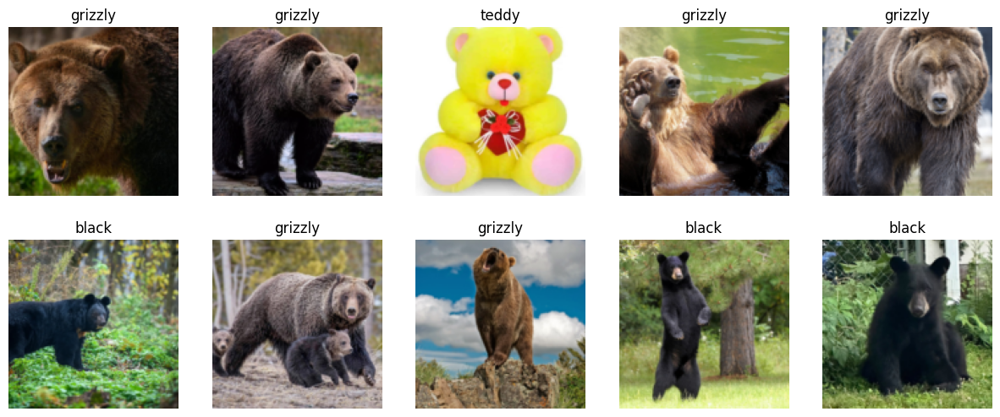

In [16]:
dls.valid.show_batch(max_n=10, nrows=2)

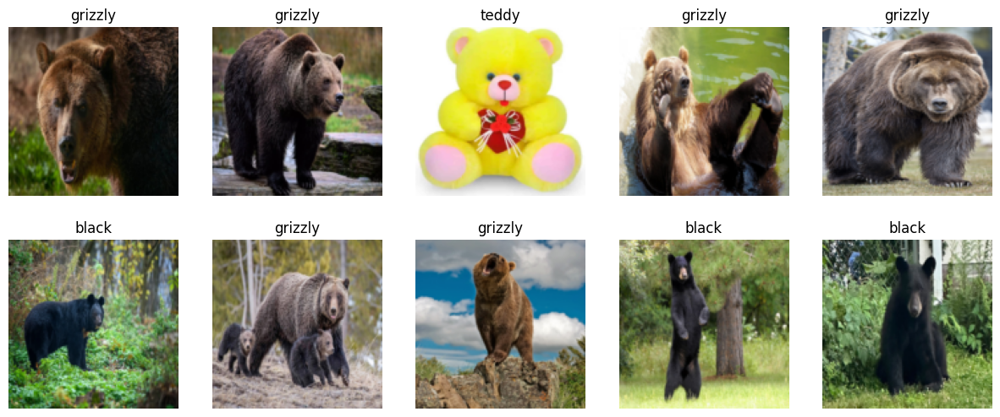

In [17]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=10, nrows=2)

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


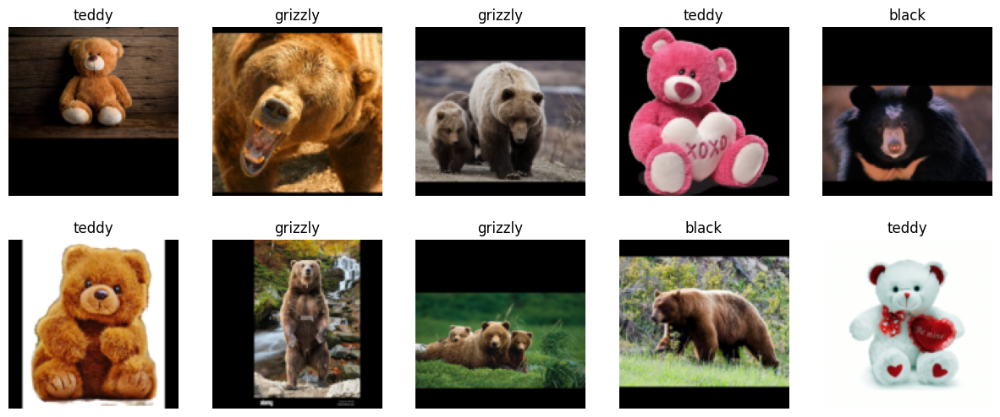

In [18]:
bears = bears.new(item_tfms= Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.show_batch(max_n=10, nrows=2)

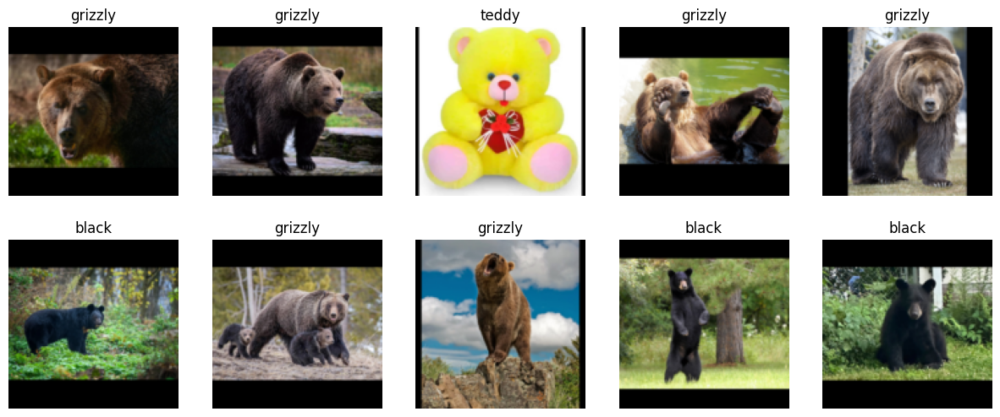

In [19]:
dls.valid.show_batch(max_n=10, nrows=2)

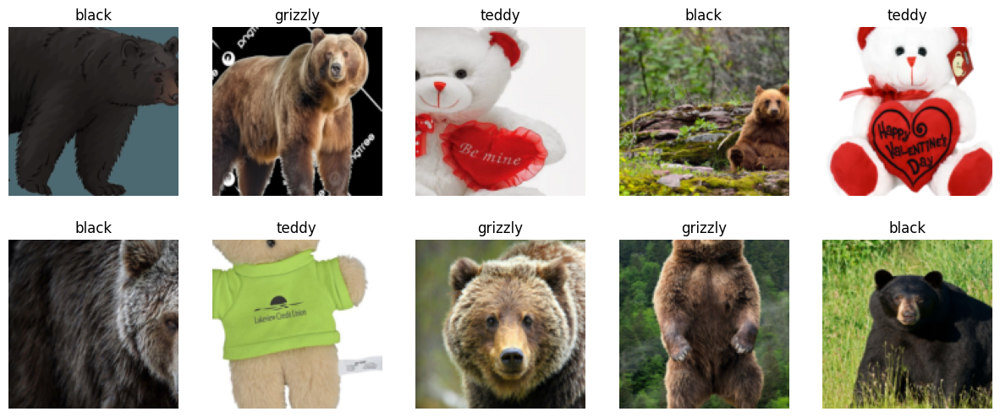

In [20]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.show_batch(max_n=10, nrows= 2)

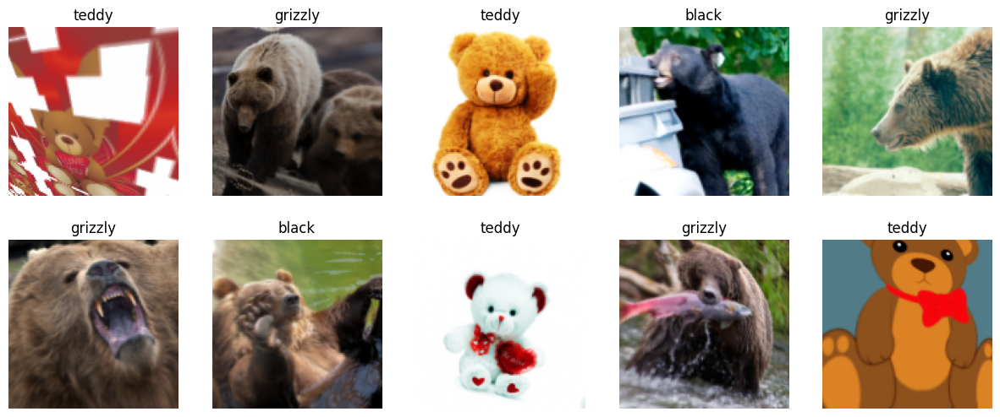

In [21]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.show_batch(max_n=10, nrows=2)

In [22]:
bears = bears.new(item_tfms=RandomResizedCrop(224, min_scale=0.5),
                  batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [23]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 133MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.095122,0.194869,0.050633,01:34


epoch,train_loss,valid_loss,error_rate,time
0,0.296378,0.212262,0.063291,01:58
1,0.236979,0.172584,0.037975,02:06
2,0.212002,0.203611,0.063291,01:59
3,0.173757,0.204939,0.050633,01:58


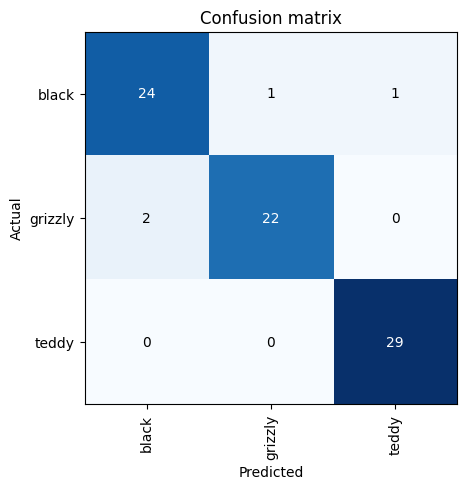

In [24]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

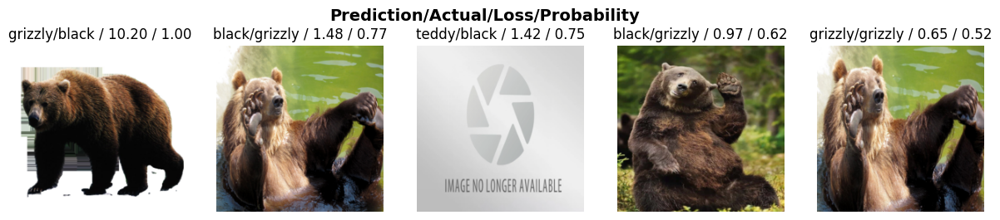

In [28]:
interp.plot_top_losses(5, nrows=1)

In [27]:
from fastai.vision.widgets import *

cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [29]:
for idx in cleaner.delete():
  cleaner.fns[idx].unlink()

In [30]:
image_files = get_image_files(path)

missing_files = [file for file in image_files if not file.exists()]

if missing_files:
  print('Missing files:')
  for file in missing_files:
    print(file)
else:
  print('No missing files')

No missing files


In [31]:
validity_list = verify_images(image_files)

list(validity_list)

[]

In [32]:
bears = bears.new(item_tfms=RandomResizedCrop(224, min_scale=0.5),
                  batch_tfms=aug_transforms())

dls = bears.dataloaders(path)

In [34]:
learn = vision_learner(dls, resnet18, metrics=error_rate)

In [35]:
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.507479,0.265798,0.101266,01:27


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.345988,0.252790,0.075949,01:59
1,0.256937,0.297547,0.063291,01:42
2,0.211660,0.327232,0.063291,01:51
3,0.170743,0.305270,0.075949,01:41


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in by

In [37]:
interpret = ClassificationInterpretation.from_learner(learn)
cleaner = ImageClassifierCleaner(learn)

cleaner

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [38]:
learn.export()

In [40]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [42]:
learn_inf = load_learner(path/'export.pkl')

In [43]:
learn_inf.predict(img)

('grizzly', tensor(1), tensor([0.0545, 0.9442, 0.0013]))

In [46]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [48]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [55]:
out_pl = widgets.Output()
out_pl.clear_output()

In [56]:
image = PILImage.create(btn_upload.data[-1])

In [57]:
with out_pl:
  display(image.to_thumb(128,128))

out_pl

Output()

In [58]:
image_2 = PILImage.create(btn_upload.data[0])

with out_pl:
  display(image_2.to_thumb(128,128))
out_pl

Output()

In [59]:
with out_pl:
  display(image.to_thumb(128,128))

out_pl

Output()

In [60]:
pred, pred_idx, prob = learn_inf.predict(image)

In [62]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}, Probabilty: {prob[pred_idx]: .4f}'
lbl_pred

Label(value='Prediction: grizzly, Probabilty:  0.9940')

In [64]:
btn_run = widgets.Button(description = 'Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [65]:
def on_click_classify(change):
  image = PILImage.create(btn_upload.data[-1])
  with out_pl: display(image.to_thumb(128,128))
  pred,pred_idx,prob = learn_inf.predict(image)
  lbl_pred.value = f'Prediction: {pred}, Probabilty: {prob[pred_idx]: .4f}'

btn_run.on_click(on_click_classify)

In [66]:
btn_run

Button(description='Classify', style=ButtonStyle())

In [67]:
VBox([widgets.Label('Select you bear'),
      btn_upload, btn_run, out_pl, lbl_pred])

In [68]:
!pip install voila

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.1/106.1 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 5.0 MB/s eta 0:00:00
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
notebook 6.5.5 requires jupyter-client<8,>=5.3.4, but you have jupyter-client 8.6.3 which is incompatible.


In [69]:
!jupyter serverextension enable --sys-prefix voila

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila 0.5.8 OK
